## Descriptive Analysis

Importing necessary libraries

In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler, StandardScaler, PolynomialFeatures
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from pandas.plotting import scatter_matrix
from factor_analyzer import FactorAnalyzer, calculate_bartlett_sphericity, calculate_kmo
import numpy as np
from sklearn.linear_model import LinearRegression
import statsmodels.api as sm
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.svm import SVR
from scipy.stats import uniform

In [21]:
# Load the dataset
qol = pd.read_csv('QOL(County Level).csv')
# Set the display option to show all columns
pd.set_option('display.max_columns', None)
# Display the first few rows of the dataset
qol.head()

,countyhelper,LSTATE,NMCNTY,FIPS,LZIP,ULOCALE,Overall Rank,2022 Population,2016 Crime Rate,Unemployment,2020PopulrVoteParty,2020 PopulrMajor%,AQI%Good,WaterQualityVPV,ParkScore2023 Rank,%CvgCityPark,NtnlPrkCnt,%CvgStatePark,Cost of Living,2022 Median Income,AVG C2I,1p0c,1p1c,1p2c,1p3c,1p4c,2p0c,2p1c,2p2c,2p3c,2p4c,Stu:Tea Rank,Diversity Rank (Race),Diversity Rank (Gender)
0,VACharles City County,VA,Charles City County,51036,23030,42-Rural: Distant,NaN,"6,605",8/1000,3.21%,D,54.11%,93.76%,0,-1,-1,1,0.73%,"$75,531.37","$78,038.78",96.79%,51.54%,74.45%,91.51%,111.16%,119.90%,67.97%,90.07%,105.57%,123.82%,131.87%,135,1,25
1,TXMcmullen County,TX,McMullen County,48311,78072,43-Rural: Remote,NaN,576,47/1000,1.81%,R,52.06%,75.33%,2,-1,-1,2,0.52%,"$63,913.28","$67,513.81",94.67%,54.47%,73.72%,86.94%,105.46%,111.95%,72.03%,90.73%,104.21%,120.05%,127.11%,3,2,87
2,TXTerrell County,TX,Terrell County,48443,79848,43-Rural: Remote,NaN,693,20/1000,3.54%,R,52.06%,75.33%,3,-1,-1,2,0.52%,"$64,361.02","$55,946.62",115.04%,67.29%,90.58%,106.09%,127.10%,135.84%,87.96%,110.73%,125.11%,145.91%,153.79%,12,3,47
3,AKSkagway Municipality,AK,Skagway Municipality,2230,99840,43-Rural: Remote,NaN,"1,081",13/1000,7.19%,R,52.83%,87.86%,16,-1,-1,8,7.66%,"$87,709.32","$85,446.30",102.65%,50.91%,79.00%,99.19%,121.39%,128.32%,69.18%,94.01%,113.02%,132.18%,139.30%,15,4,9
4,GABaker County,GA,Baker County,13007,39870,42-Rural: Distant,NaN,"2,788",0,4.19%,D,49.50%,83.30%,0,-1,-1,0,0.00%,"$59,389.29","$52,946.23",112.17%,63.61%,85.92%,103.34%,122.57%,131.91%,85.54%,108.73%,124.45%,141.99%,153.63%,26,5,60


Normalizing values in the dataset, e.g., 8/1000, 54.11%, etc.

In [22]:
def normalization(csv_file):

    # Drop NaN columns
    csv_file.dropna(axis=1, inplace=True)

    # Dropping categorical variables
    columns_to_drop = ['countyhelper', 'LSTATE', 'NMCNTY', 'FIPS', 'LZIP', 'ULOCALE', '2020PopulrVoteParty', '%CvgCityPark']
    csv_file.drop(columns=columns_to_drop, inplace=True)

    csv_file['2022 Population'] = csv_file['2022 Population'].astype(str).str.replace(',', '').astype(float)
    csv_file['2016 Crime Rate'] = csv_file['2016 Crime Rate'].astype(str).str.split('/').str[0].astype(float) / 1000
    csv_file['Unemployment'] = csv_file['Unemployment'].astype(str).str.replace('%', '').astype(float) / 100
    csv_file['2020 PopulrMajor%'] = csv_file['2020 PopulrMajor%'].astype(str).str.replace('%', '').astype(float) / 100
    csv_file['AQI%Good'] = csv_file['AQI%Good'].astype(str).str.replace('%', '').astype(float) / 100
    csv_file['%CvgStatePark'] = csv_file['%CvgStatePark'].astype(str).str.replace('%', '').astype(float) / 100
    csv_file['Cost of Living'] = csv_file['Cost of Living'].astype(str).str.replace('$', '').str.replace(',', '').astype(float)
    csv_file['2022 Median Income'] = csv_file['2022 Median Income'].astype(str).str.replace('$', '').str.replace(',', '').astype(float)
    csv_file['AVG C2I'] = csv_file['AVG C2I'].astype(str).str.replace('%', '').astype(float) / 100
    csv_file['1p0c'] = csv_file['1p0c'].astype(str).str.replace('%', '').astype(float) / 100
    csv_file['1p1c'] = csv_file['1p1c'].astype(str).str.replace('%', '').astype(float) / 100
    csv_file['1p2c'] = csv_file['1p2c'].astype(str).str.replace('%', '').astype(float) / 100
    csv_file['1p3c'] = csv_file['1p3c'].astype(str).str.replace('%', '').astype(float) / 100
    csv_file['1p4c'] = csv_file['1p4c'].astype(str).str.replace('%', '').astype(float) / 100
    csv_file['2p0c'] = csv_file['2p0c'].astype(str).str.replace('%', '').astype(float) / 100
    csv_file['2p1c'] = csv_file['2p1c'].astype(str).str.replace('%', '').astype(float) / 100
    csv_file['2p2c'] = csv_file['2p2c'].astype(str).str.replace('%', '').astype(float) / 100
    csv_file['2p3c'] = csv_file['2p3c'].astype(str).str.replace('%', '').astype(float) / 100
    csv_file['2p4c'] = csv_file['2p4c'].astype(str).str.replace('%', '').astype(float) / 100

normalization(qol)

summary_stats = qol.describe()

# Display the summary statistics
summary_stats


C:\Users\VorteX\AppData\Local\Temp\ipykernel_19040\1143104043.py:16: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
  csv_file['Cost of Living'] = csv_file['Cost of Living'].astype(str).str.replace('$', '').str.replace(',', '').astype(float)
C:\Users\VorteX\AppData\Local\Temp\ipykernel_19040\1143104043.py:17: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
  csv_file['2022 Median Income'] = csv_file['2022 Median Income'].astype(str).str.replace('$', '').str.replace(',', '').astype(float)


,2022 Population,2016 Crime Rate,Unemployment,2020 PopulrMajor%,AQI%Good,WaterQualityVPV,ParkScore2023 Rank,NtnlPrkCnt,%CvgStatePark,Cost of Living,2022 Median Income,AVG C2I,1p0c,1p1c,1p2c,1p3c,1p4c,2p0c,2p1c,2p2c,2p3c,2p4c,Stu:Tea Rank,Diversity Rank (Race),Diversity Rank (Gender)
count,3.134000e+03,3134.000000,3134.000000,3134.000000,3134.000000,3134.000000,3134.000000,3134.000000,3134.000000,3134.000000,3134.000000,3134.000000,3134.000000,3134.000000,3134.000000,3134.000000,3134.000000,3134.000000,3134.000000,3134.000000,3134.000000,3134.000000,3134.000000,3134.000000,3134.000000
mean,1.062232e+05,0.018969,0.037369,0.564658,0.843802,2.689215,-0.900128,1.164008,0.001249,70900.878223,68299.384655,1.074221,0.559173,0.810489,1.006674,1.229139,1.315519,0.758723,1.007556,1.188318,1.388201,1.478426,1482.638162,1567.497128,1567.495852
std,3.330201e+05,0.012223,0.013372,0.051906,0.065342,10.376495,2.031961,1.609866,0.070699,10297.226141,16832.313856,0.195961,0.115117,0.144531,0.179486,0.217643,0.235896,0.156865,0.188309,0.219796,0.254318,0.274299,902.947428,904.855701,904.857689
min,2.330000e+02,0.000000,-0.010000,0.485900,0.683400,-1.000000,-1.000000,0.000000,-1.000000,54431.020000,25529.980000,0.520000,0.255900,0.396900,0.497400,0.622800,0.658400,0.337400,0.473200,0.568500,0.676100,0.713200,-1.000000,1.000000,1.000000
25%,1.077850e+04,0.011000,0.028100,0.520600,0.806700,0.000000,-1.000000,0.000000,0.000000,64192.640000,57275.590000,0.944350,0.479600,0.714275,0.887150,1.086150,1.160325,0.650725,0.883825,1.042700,1.220050,1.296500,698.250000,784.250000,784.250000
50%,2.599000e+04,0.017000,0.035300,0.564500,0.845300,1.000000,-1.000000,1.000000,0.000700,68559.505000,65955.605000,1.045700,0.543800,0.789450,0.982500,1.199500,1.281750,0.737150,0.983050,1.160200,1.353650,1.437550,1481.500000,1567.500000,1567.500000
75%,6.890375e+04,0.026000,0.043800,0.606600,0.884200,3.000000,-1.000000,1.000000,0.005200,74748.505000,76080.112500,1.171925,0.620075,0.882475,1.097100,1.337850,1.433550,0.841000,1.101975,1.300475,1.517075,1.618250,2264.750000,2350.750000,2350.750000
max,9.721138e+06,0.089000,0.171900,0.921500,0.993500,456.000000,52.000000,9.000000,0.076600,167022.470000,177662.470000,2.873000,1.476200,2.072000,2.639800,3.217100,3.503200,2.097100,2.718200,3.225500,3.744700,4.036400,3048.000000,3134.000000,3134.000000


In [4]:
# Correlation matrix of numerical values
corr_matrix = qol.corr(numeric_only=True)
corr_matrix

,FIPS,LZIP,2022 Population,2016 Crime Rate,Unemployment,2020 PopulrMajor%,AQI%Good,WaterQualityVPV,ParkScore2023 Rank,NtnlPrkCnt,%CvgStatePark,Cost of Living,2022 Median Income,AVG C2I,1p0c,1p1c,1p2c,1p3c,1p4c,2p0c,2p1c,2p2c,2p3c,2p4c,Stu:Tea Rank,Diversity Rank (Race),Diversity Rank (Gender)
FIPS,1.000000,-0.079282,-0.054541,-0.060402,0.034168,-0.041244,0.179625,0.008466,0.040115,-0.116903,-0.001021,-0.002346,0.062700,-0.081286,-0.100925,-0.089731,-0.074716,-0.084255,-0.081929,-0.083162,-0.081268,-0.072103,-0.074255,-0.074905,-0.004605,-0.035932,0.009773
LZIP,-0.079282,1.000000,-0.017719,0.029308,0.033962,0.107099,-0.433239,0.114205,-0.048541,0.487016,0.203131,0.000076,-0.044401,0.030403,0.019271,0.004829,0.014957,0.048981,0.056529,0.018353,0.007864,0.013703,0.042533,0.042982,-0.109414,-0.075417,-0.070425
2022 Population,-0.054541,-0.017719,1.000000,0.213977,0.027747,0.000062,-0.111772,0.020549,0.055010,0.172767,-0.047781,0.350503,0.268221,-0.081371,-0.133967,-0.064511,-0.057230,-0.030819,-0.045463,-0.149972,-0.111223,-0.100168,-0.072074,-0.080903,0.391817,0.396166,0.409488
2016 Crime Rate,-0.060402,0.029308,0.213977,1.000000,0.122543,-0.036073,-0.159649,-0.008909,0.094084,0.073822,-0.003157,-0.015941,-0.073729,0.049825,0.034637,0.059388,0.041018,0.059980,0.056010,0.030677,0.047770,0.039228,0.056732,0.053190,0.429135,0.339114,0.409458
Unemployment,0.034168,0.033962,0.027747,0.122543,1.000000,-0.066397,-0.198246,0.068768,0.000964,0.173560,0.002127,-0.130051,-0.344195,0.403473,0.393852,0.426704,0.398176,0.397805,0.389289,0.390439,0.407352,0.397219,0.397817,0.391219,0.047671,0.090760,0.054659
2020 PopulrMajor%,-0.041244,0.107099,0.000062,-0.036073,-0.066397,1.000000,0.084736,-0.040900,-0.008878,0.044722,-0.146969,0.193514,0.019286,0.140653,0.078258,0.080324,0.153594,0.166086,0.167170,0.096264,0.095143,0.149823,0.162115,0.162858,-0.047432,0.011701,-0.009257
AQI%Good,0.179625,-0.433239,-0.111772,-0.159649,-0.198246,0.084736,1.000000,0.000206,0.041692,-0.341369,-0.063583,0.087606,0.113116,-0.073377,-0.136106,-0.100266,-0.047823,-0.054047,-0.052527,-0.114241,-0.090480,-0.058430,-0.064874,-0.060476,-0.056598,-0.072575,-0.075893
WaterQualityVPV,0.008466,0.114205,0.020549,-0.008909,0.068768,-0.040900,0.000206,1.000000,-0.009836,0.150350,0.030858,0.065690,0.022481,0.024681,0.013239,0.029503,0.029539,0.036263,0.032146,0.010048,0.017447,0.018946,0.025356,0.023070,0.026052,0.033622,0.034565
ParkScore2023 Rank,0.040115,-0.048541,0.055010,0.094084,0.000964,-0.008878,0.041692,-0.009836,1.000000,-0.010375,-0.001821,0.048768,0.022750,0.006554,-0.008731,0.007201,0.009140,0.017074,0.016113,-0.010212,0.000084,0.002005,0.008868,0.009251,0.071781,0.066080,0.072503
NtnlPrkCnt,-0.116903,0.487016,0.172767,0.073822,0.173560,0.044722,-0.341369,0.150350,-0.010375,1.000000,0.205143,0.267636,0.110118,0.052046,0.030226,0.068655,0.047179,0.090725,0.085230,0.006555,0.029831,0.019011,0.058362,0.053242,0.125220,0.123841,0.128190


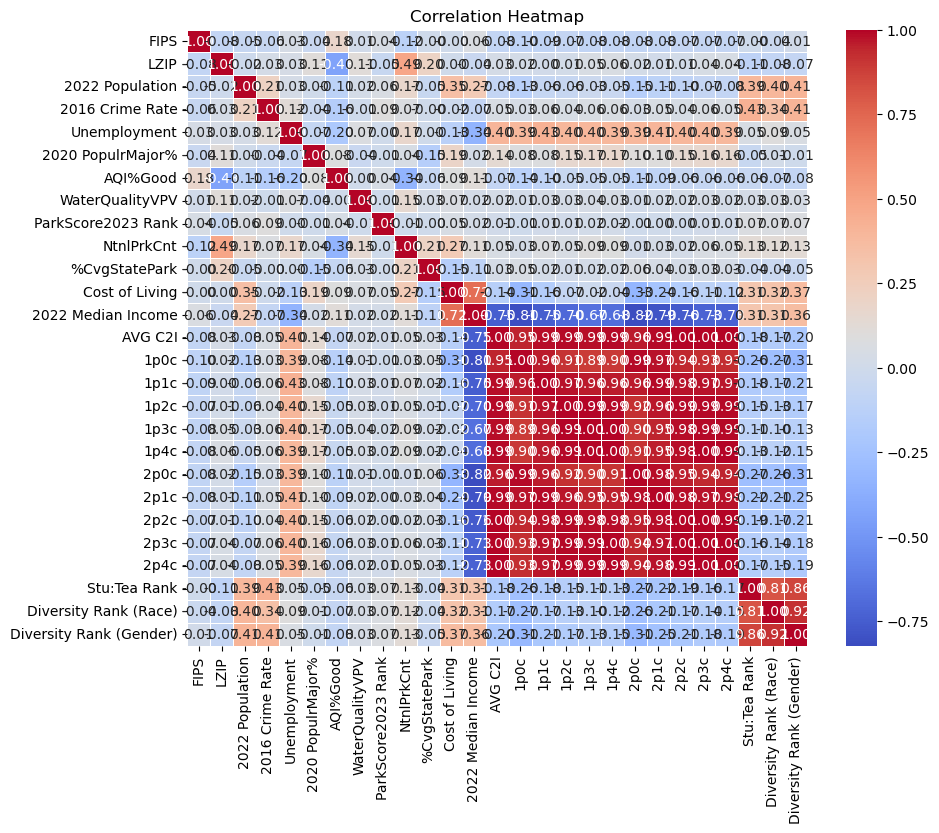

In [5]:
# Display the correlation heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
plt.title("Correlation Heatmap")
plt.show()

Strong positive correlation is indicated by values closer to 1, or color close to red. While strong negative correlation is indicated by values closer to -1, or color close to blue. While weak or no correlation is indicated by value closer to 0, or color closer to white.

We can see that the features that has high positive correlation between each other are 'AVG C2I', '1p0c', '1p1c', '1p2c', '1p3c', '1p4c', '2p0c', '2p1c', '2p2c', '2p3c', and ‘2p4c’, while '2022 Median Income' are strongly, negatively correlated with the variables mentioned before. 

Another set of features that has high positive correlation between each other are 'Stu:Tea Rank', 'Diversity Rank (Race)', and 'Diversity Rank (Gender)'.

In [6]:
# Skewness and kurtosis
skewness = qol.skew(numeric_only=True)
kurtosis = qol.kurtosis(numeric_only=True)

# Display skewness and kurtosis value
print("\nSkewness:")
print(skewness)
print("\nKurtosis:")
print(kurtosis)


Skewness:
FIPS                       -0.079949
LZIP                       -0.025377
2022 Population            12.785003
2016 Crime Rate             0.952114
Unemployment                1.855095
2020 PopulrMajor%           0.504099
AQI%Good                   -0.482114
WaterQualityVPV            28.727792
ParkScore2023 Rank         22.138907
NtnlPrkCnt                  2.996726
%CvgStatePark             -13.578656
Cost of Living              2.297891
2022 Median Income          1.270779
AVG C2I                     1.307914
1p0c                        1.167077
1p1c                        1.304256
1p2c                        1.315267
1p3c                        1.306297
1p4c                        1.313293
2p0c                        1.238461
2p1c                        1.291723
2p2c                        1.279297
2p3c                        1.295909
2p4c                        1.311582
Stu:Tea Rank                0.006819
Diversity Rank (Race)      -0.000009
Diversity Rank (Gender)    

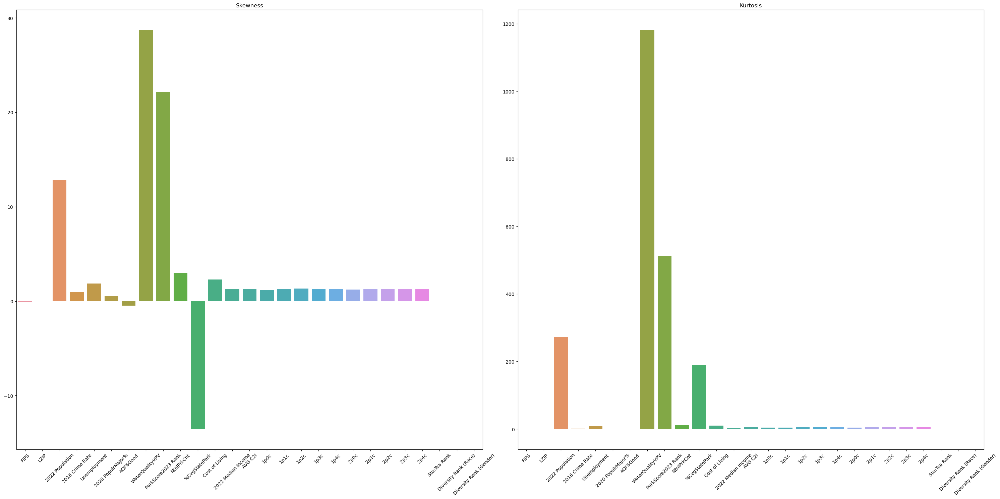

In [7]:
plt.figure(figsize=(30, 15))
plt.subplot(1, 2, 1)
sns.barplot(x=skewness.index, y=skewness)
plt.title("Skewness")
plt.xticks(rotation=45)

plt.subplot(1, 2, 2)
sns.barplot(x=kurtosis.index, y=kurtosis)
plt.title("Kurtosis")
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

* Most of the variables in the dataset have positive skewness, which indicates asymmetry with longer tail on the right 
* For the kurtosis, most of the variables also have high kurtosis (>3), indicating more peaked than normal distribution, or distribution with heavier tails and sharper peak compared to normal distribution.

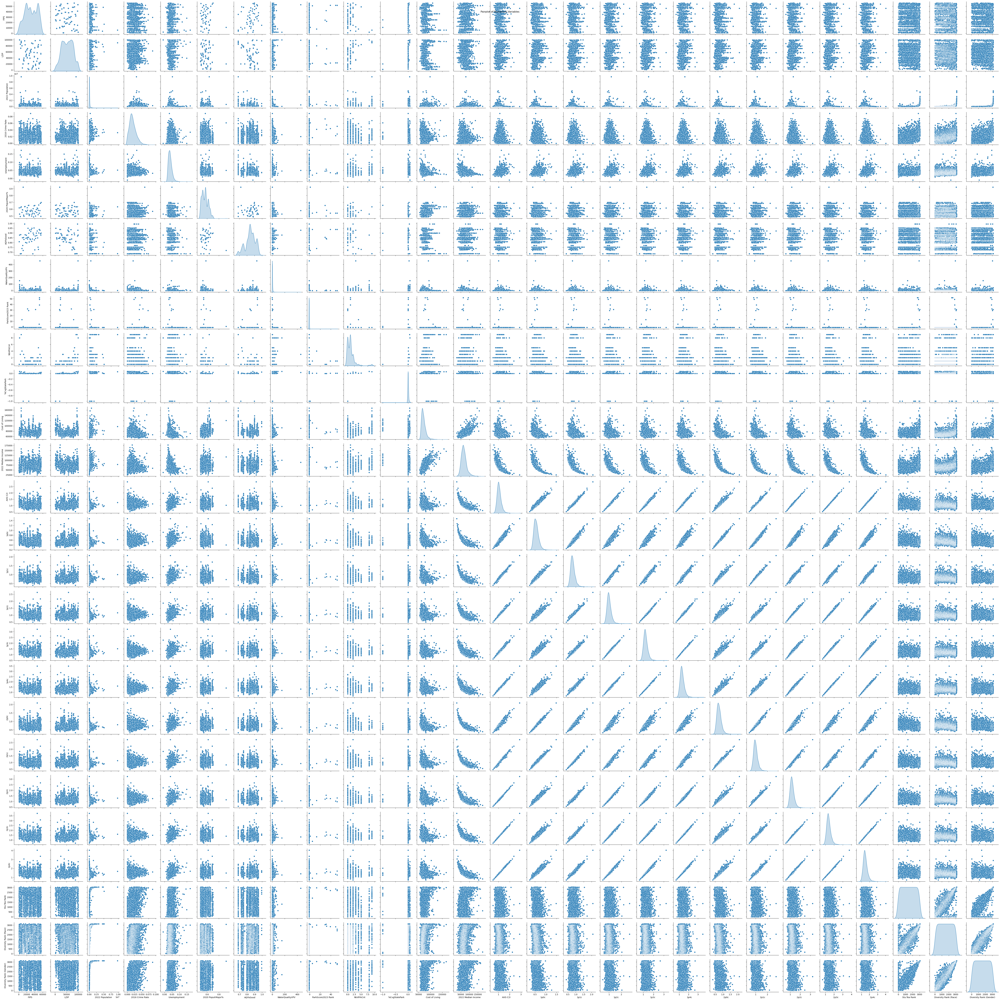

In [8]:
# Visualization with pairplot
# Pairplot for numerical variables
sns.pairplot(qol, diag_kind = 'kde')
plt.suptitle("Pairplot of Numerical Variables")
plt.show()

The pairplot visualizes the relationships between numerical variables, which is useful for dataset understanding.

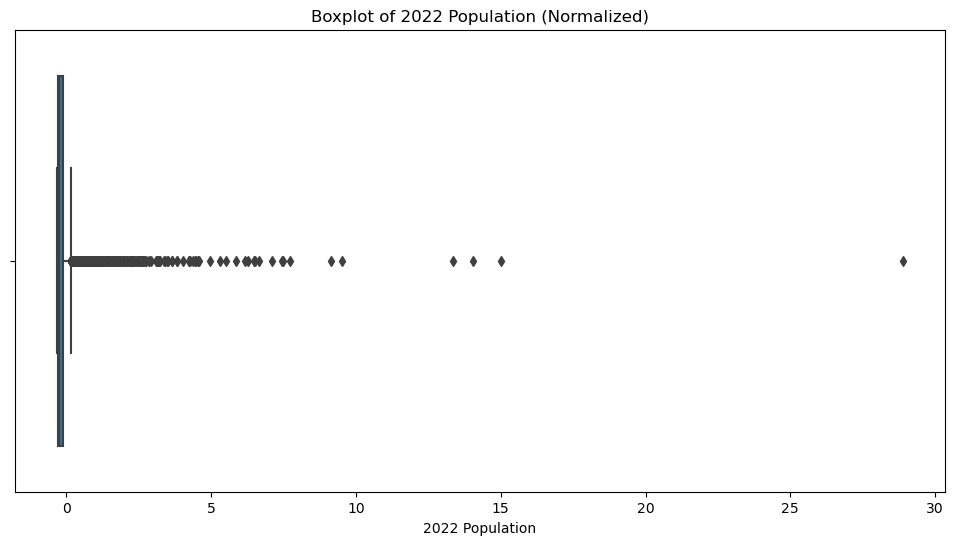

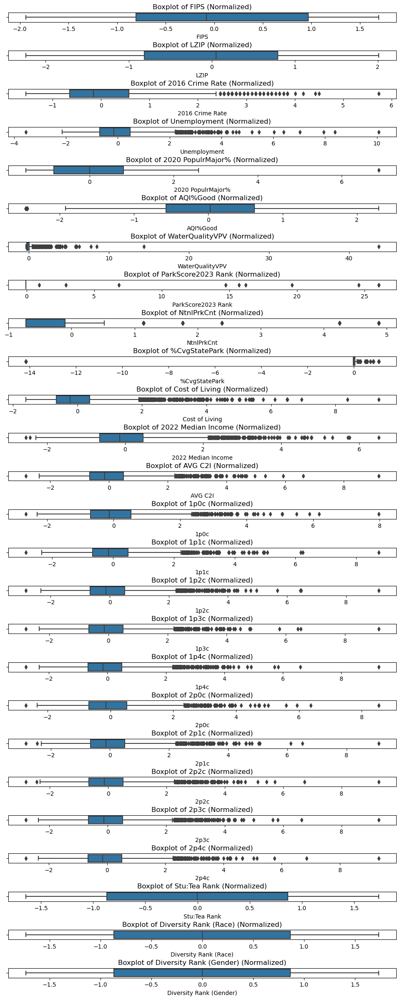

In [9]:
from sklearn.preprocessing import StandardScaler

# Normalize variables for boxplot
scaler = StandardScaler()
qol_normalized = pd.DataFrame(scaler.fit_transform(qol.select_dtypes(include="number")), columns=qol.select_dtypes(include="number").columns)

# Boxplot for 2022 Population
plt.figure(figsize=(12, 6))
sns.boxplot(data=qol_normalized, x=qol_normalized["2022 Population"], orient="h")
plt.title("Boxplot of 2022 Population (Normalized)")
plt.show()

# Boxplots for other numerical variables
numerical_columns = qol_normalized.columns.drop("2022 Population")
num_plots = len(numerical_columns)

plt.figure(figsize=(12, 30))
for i, column in enumerate(numerical_columns):
    plt.subplot(num_plots, 1, i+1)
    sns.boxplot(data=qol_normalized, x=qol_normalized[column], orient="h")
    plt.title(f"Boxplot of {column} (Normalized)")

plt.subplots_adjust(hspace=3.0)
plt.show()


The boxplot summarizes the median, range, and the interquartile range (IQR) of the dataset. Taking the boxplot of FIPS (Normalized) as example, its median is around -0.1, it ranges from -1.95 to 1.8, its first interquartile range is at -0.8, its second interquartile range, which is its median, is at -0.1, and its third interquartile range is at 1.95.

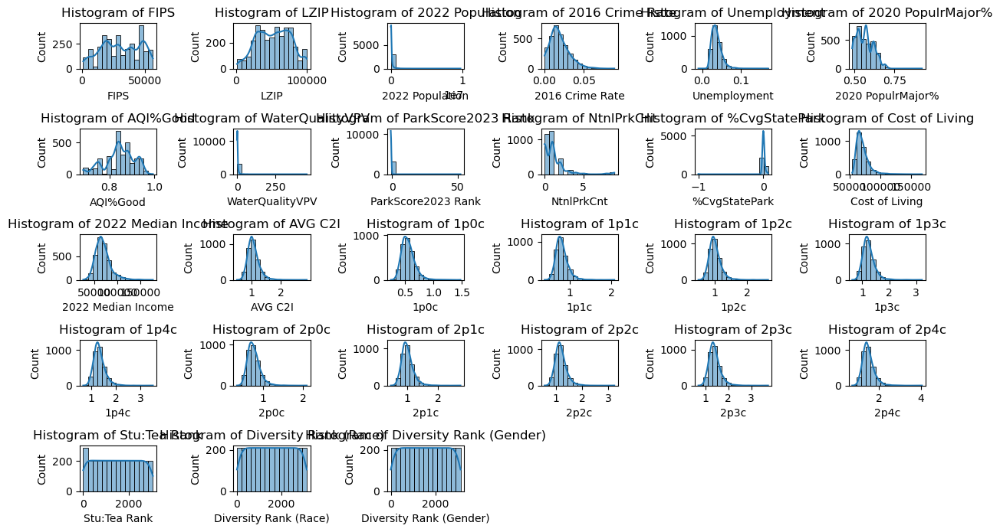

In [10]:
# Histograms for numerical variables
plt.figure(figsize=(12, 8))
numerical_columns = qol.select_dtypes(include="number").columns
num_plots = len(numerical_columns)

for i, column in enumerate(numerical_columns):
    plt.subplot(6, 6, i+1)
    sns.histplot(qol[column], bins=15, kde=True)
    plt.title(f"Histogram of {column}")

plt.tight_layout()
plt.show()

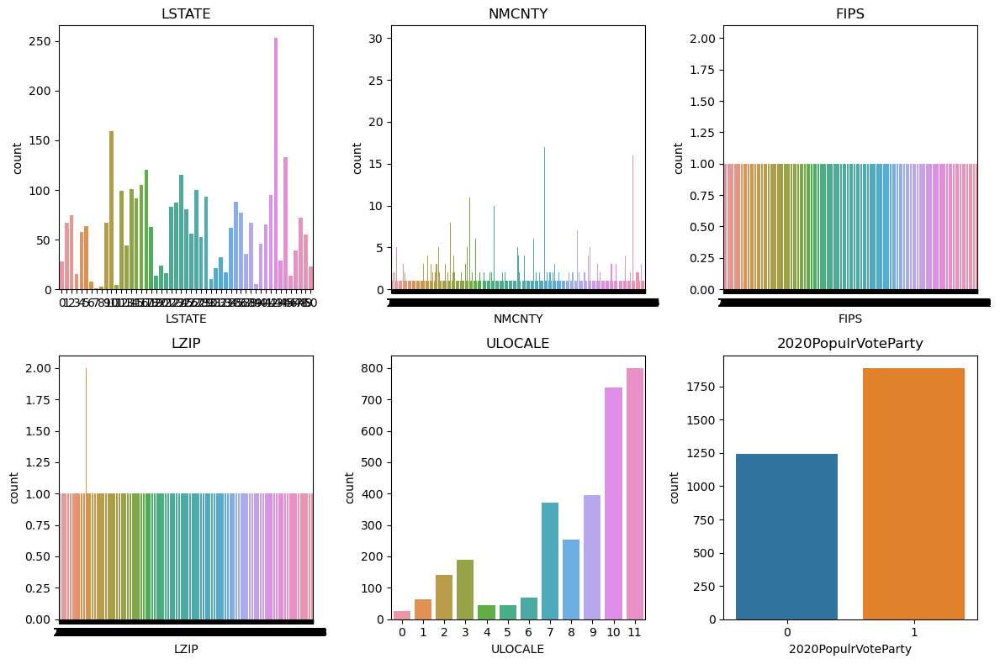

In [11]:
from sklearn.preprocessing import LabelEncoder

# Create an instance of LabelEncoder
label_encoder = LabelEncoder()

# Encode categorical variables to numerical
qol_encoded = qol.copy()
categorical_columns = ['LSTATE', 'NMCNTY', 'FIPS', 'LZIP', 'ULOCALE', '2020PopulrVoteParty']
for column in categorical_columns:
    qol_encoded[column] = label_encoder.fit_transform(qol_encoded[column])

# Plot countplot for categorical variables
plt.figure(figsize=(12, 8))
for i, column in enumerate(categorical_columns):
    plt.subplot(2, 3, i+1)
    sns.countplot(data=qol_encoded, x=column)
    plt.title(column)

plt.tight_layout()
plt.show()


## Preprocessing

In [24]:
qol = pd.read_csv('./QOL(County Level).csv')

qol.isnull().sum()

countyhelper                  0
LSTATE                        0
NMCNTY                        0
FIPS                          0
LZIP                          0
ULOCALE                       0
Overall Rank               3134
2022 Population               0
2016 Crime Rate               0
Unemployment                  0
2020PopulrVoteParty           0
2020 PopulrMajor%             0
AQI%Good                      0
WaterQualityVPV               0
ParkScore2023 Rank            0
%CvgCityPark                  0
NtnlPrkCnt                    0
%CvgStatePark                 0
Cost of Living                0
2022 Median Income            0
AVG C2I                       0
1p0c                          0
1p1c                          0
1p2c                          0
1p3c                          0
1p4c                          0
2p0c                          0
2p1c                          0
2p2c                          0
2p3c                          0
2p4c                          0
Stu:Tea 

In [25]:
qol.info()

pd.set_option('display.max_columns', None)
qol.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3134 entries, 0 to 3133
Data columns (total 34 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   countyhelper             3134 non-null   object 
 1   LSTATE                   3134 non-null   object 
 2   NMCNTY                   3134 non-null   object 
 3   FIPS                     3134 non-null   int64  
 4   LZIP                     3134 non-null   int64  
 5   ULOCALE                  3134 non-null   object 
 6   Overall Rank             0 non-null      float64
 7   2022 Population          3134 non-null   object 
 8   2016 Crime Rate          3134 non-null   object 
 9   Unemployment             3134 non-null   object 
 10  2020PopulrVoteParty      3134 non-null   object 
 11  2020 PopulrMajor%        3134 non-null   object 
 12  AQI%Good                 3134 non-null   object 
 13  WaterQualityVPV          3134 non-null   int64  
 14  ParkScore2023 Rank      

,countyhelper,LSTATE,NMCNTY,FIPS,LZIP,ULOCALE,Overall Rank,2022 Population,2016 Crime Rate,Unemployment,2020PopulrVoteParty,2020 PopulrMajor%,AQI%Good,WaterQualityVPV,ParkScore2023 Rank,%CvgCityPark,NtnlPrkCnt,%CvgStatePark,Cost of Living,2022 Median Income,AVG C2I,1p0c,1p1c,1p2c,1p3c,1p4c,2p0c,2p1c,2p2c,2p3c,2p4c,Stu:Tea Rank,Diversity Rank (Race),Diversity Rank (Gender)
0,VACharles City County,VA,Charles City County,51036,23030,42-Rural: Distant,NaN,"6,605",8/1000,3.21%,D,54.11%,93.76%,0,-1,-1,1,0.73%,"$75,531.37","$78,038.78",96.79%,51.54%,74.45%,91.51%,111.16%,119.90%,67.97%,90.07%,105.57%,123.82%,131.87%,135,1,25
1,TXMcmullen County,TX,McMullen County,48311,78072,43-Rural: Remote,NaN,576,47/1000,1.81%,R,52.06%,75.33%,2,-1,-1,2,0.52%,"$63,913.28","$67,513.81",94.67%,54.47%,73.72%,86.94%,105.46%,111.95%,72.03%,90.73%,104.21%,120.05%,127.11%,3,2,87
2,TXTerrell County,TX,Terrell County,48443,79848,43-Rural: Remote,NaN,693,20/1000,3.54%,R,52.06%,75.33%,3,-1,-1,2,0.52%,"$64,361.02","$55,946.62",115.04%,67.29%,90.58%,106.09%,127.10%,135.84%,87.96%,110.73%,125.11%,145.91%,153.79%,12,3,47
3,AKSkagway Municipality,AK,Skagway Municipality,2230,99840,43-Rural: Remote,NaN,"1,081",13/1000,7.19%,R,52.83%,87.86%,16,-1,-1,8,7.66%,"$87,709.32","$85,446.30",102.65%,50.91%,79.00%,99.19%,121.39%,128.32%,69.18%,94.01%,113.02%,132.18%,139.30%,15,4,9
4,GABaker County,GA,Baker County,13007,39870,42-Rural: Distant,NaN,"2,788",0,4.19%,D,49.50%,83.30%,0,-1,-1,0,0.00%,"$59,389.29","$52,946.23",112.17%,63.61%,85.92%,103.34%,122.57%,131.91%,85.54%,108.73%,124.45%,141.99%,153.63%,26,5,60


### Handling missing values and normalization

In [26]:
normalization(qol)

C:\Users\VorteX\AppData\Local\Temp\ipykernel_19040\1143104043.py:16: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
  csv_file['Cost of Living'] = csv_file['Cost of Living'].astype(str).str.replace('$', '').str.replace(',', '').astype(float)
C:\Users\VorteX\AppData\Local\Temp\ipykernel_19040\1143104043.py:17: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
  csv_file['2022 Median Income'] = csv_file['2022 Median Income'].astype(str).str.replace('$', '').str.replace(',', '').astype(float)


Dropping "AVG C2I" column (y-variable / target variable)

In [27]:
x_qol = qol.drop(["AVG C2I"], axis=1)
y = qol["AVG C2I"].values
y_qol = pd.DataFrame(y, columns = ["AVG C2I"])

Normalizing into scale of 0 to 1 using MinMaxScaler

In [28]:
scaler = MinMaxScaler()
x_norm = scaler.fit_transform(x_qol)
y_norm = scaler.fit_transform(y_qol)

Random Forest Regressor for determining feature importance and selecting and dropping features based on that importance.

In [29]:
# Create a Random Forest regressor
rf = RandomForestRegressor(n_estimators=100, random_state=42)

# Fit the regressor to data
rf.fit(x_norm, y_norm)

print(rf.feature_importances_)

c:\Users\VorteX\anaconda3\Lib\site-packages\sklearn\base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[7.93308603e-05 1.02123246e-04 7.22703657e-05 9.55934245e-05
 6.71938811e-05 9.53804737e-05 1.96102378e-07 5.88131944e-05
 6.68888159e-05 1.62080763e-04 4.16817979e-04 1.11299791e-03
 4.82915361e-03 1.34204486e-03 1.84577354e-03 2.74037520e-03
 1.24446226e-03 5.95696709e-03 1.93750531e-01 4.70640811e-01
 3.15143346e-01 7.87981297e-05 3.90327218e-05 5.90172297e-05]


In [30]:
# Convert x_norm to a DataFrame
x_norm_df = pd.DataFrame(x_norm, columns=qol.columns[:-1])

# Drop 5 features that has the lowest importance
importances = rf.feature_importances_
feature_importances = dict(zip(x_norm_df.columns, importances))
sorted_importances = sorted(feature_importances.items(), key=lambda x: x[1])
features_to_drop = [feature[0] for feature in sorted_importances[:5]]
features_to_drop.append('AVG C2I')  # Also drop AVG C2I (y variable)
x_norm_dropped = x_norm_df.drop(features_to_drop, axis=1)

# Features that were dropped
print("Features that were dropped:", features_to_drop)

x_norm_dropped


Features that were dropped: ['ParkScore2023 Rank', 'Stu:Tea Rank', 'NtnlPrkCnt', 'Diversity Rank (Race)', '%CvgStatePark', 'AVG C2I']


,2022 Population,2016 Crime Rate,Unemployment,2020 PopulrMajor%,AQI%Good,WaterQualityVPV,Cost of Living,2022 Median Income,1p0c,1p1c,1p2c,1p3c,1p4c,2p0c,2p1c,2p2c,2p3c,2p4c
0,0.000655,0.089888,0.231446,0.126722,0.819736,0.002188,0.187406,0.345152,0.207510,0.194968,0.188413,0.190031,0.194522,0.190423,0.183365,0.183178,0.182204,0.044605
1,0.000035,0.528090,0.154480,0.079660,0.225411,0.006565,0.084218,0.275969,0.203152,0.173637,0.166442,0.162085,0.217594,0.193363,0.178246,0.170892,0.167880,0.001312
2,0.000047,0.224719,0.249588,0.079660,0.225411,0.008753,0.088195,0.199935,0.303803,0.263023,0.249855,0.246063,0.308121,0.282450,0.256906,0.255165,0.248164,0.004264
3,0.000087,0.146067,0.450247,0.097337,0.629474,0.037199,0.295567,0.393843,0.234673,0.230816,0.227846,0.219629,0.201398,0.207973,0.211404,0.210422,0.204562,0.005248
4,0.000263,0.000000,0.285322,0.020891,0.482425,0.002188,0.044038,0.180213,0.275984,0.250187,0.232394,0.232248,0.294368,0.273541,0.254422,0.242391,0.247683,0.008855
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3129,0.324142,0.258427,0.234744,0.341827,0.003870,0.004376,0.510502,0.520991,0.274252,0.238798,0.264464,0.249086,0.202023,0.217862,0.198495,0.231180,0.222466,0.998688
3130,0.468196,0.359551,0.245190,0.017677,0.001612,0.008753,0.252385,0.350342,0.226673,0.233990,0.251629,0.242548,0.193272,0.208196,0.213549,0.231408,0.224904,0.999016
3131,0.491794,0.460674,0.297416,0.079660,0.225411,0.006565,0.122505,0.313145,0.197660,0.175597,0.175384,0.169221,0.182304,0.179198,0.166504,0.169589,0.167309,0.999344
3132,0.525574,0.370787,0.346344,0.205464,0.382457,0.002188,0.240846,0.377172,0.216405,0.214199,0.211001,0.207361,0.166506,0.189710,0.190892,0.195073,0.191292,0.855362


In [31]:
x_norm = x_norm_dropped

KMO and Bartlett for factor analysis

In [32]:
# KMO
kmo_all, kmo_model = calculate_kmo(x_norm)
print('KMO Model Score:', kmo_model)

KMO Model Score: 0.8700125117215096


c:\Users\VorteX\anaconda3\Lib\site-packages\factor_analyzer\utils.py:244: UserWarning: The inverse of the variance-covariance matrix was calculated using the Moore-Penrose generalized matrix inversion, due to its determinant being at or very close to zero.
  warnings.warn(


KMO Model Score of 0.87 indicates that the KMO Model is acceptable.

In [33]:
# Bartlett's test of sphericity
chi_square, p_value = calculate_bartlett_sphericity(x_norm)
print("Bartlett's test of sphericity: ")
print("P-value: ", p_value)

Bartlett's test of sphericity: 
P-value:  0.0


P-value of 0.0, indicates high correlation between the variables

0.21397732860389426
[[ 1.00000000e+00  2.13977329e-01  2.77471599e-02  6.24505154e-05
  -1.11772187e-01  2.05491930e-02  3.50502797e-01  2.68220656e-01
  -6.45106274e-02 -5.72303378e-02 -3.08186205e-02 -4.54634850e-02
  -1.49971805e-01 -1.11222795e-01 -1.00168471e-01 -7.20736705e-02
  -8.09027139e-02  3.91816688e-01]
 [ 2.13977329e-01  1.00000000e+00  1.22543345e-01 -3.60726891e-02
  -1.59649020e-01 -8.90938828e-03 -1.59409062e-02 -7.37286195e-02
   5.93877802e-02  4.10181395e-02  5.99798718e-02  5.60099681e-02
   3.06770128e-02  4.77703499e-02  3.92282491e-02  5.67317405e-02
   5.31903047e-02  4.29134606e-01]
 [ 2.77471599e-02  1.22543345e-01  1.00000000e+00 -6.63967717e-02
  -1.98245614e-01  6.87675924e-02 -1.30050601e-01 -3.44195261e-01
   4.26703620e-01  3.98176045e-01  3.97804877e-01  3.89289300e-01
   3.90438868e-01  4.07352375e-01  3.97219428e-01  3.97817242e-01
   3.91219489e-01  4.76707638e-02]
 [ 6.24505154e-05 -3.60726891e-02 -6.63967717e-02  1.00000000e+00
   8.47361007e-02

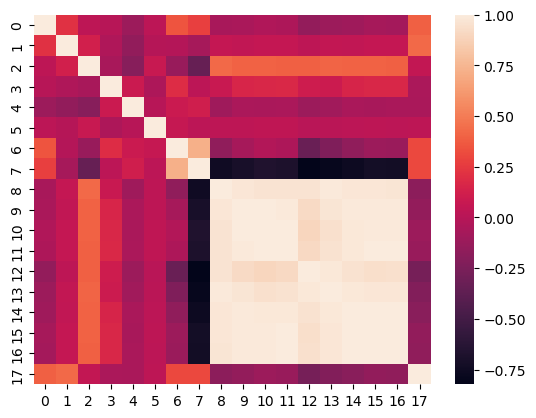

In [34]:
# Calculate correlation matrix

corr = np.corrcoef(x_norm, rowvar = False)
print(corr[0, 1])
print(corr)

sns.heatmap(corr)
plt.show()

Strong positive correlation is indicated by values closer to 1, or brighter colors. While strong negative correlation is indicated by values closer to -1, or darker colors.

We can see that the features that has high positive correlation between each other are 'AVG C2I', '1p0c', '1p1c', '1p2c', '1p3c', '1p4c', '2p0c', '2p1c', '2p2c', '2p3c', and ‘2p4c’, while '2022 Median Income' are strongly, negatively correlated with the variables mentioned before. 

Another set of features that has high positive correlation between each other are 'Stu:Tea Rank', 'Diversity Rank (Race)', and 'Diversity Rank (Gender)'.

With factor analysis, we will figure out the underlying relationships between variables, revealing the underlying structure that might not be apparent when looking at individual variables

### Analyzing

In [35]:
# Perform factor analysis
n_factors = x_norm.shape[1]
fa = FactorAnalyzer(n_factors, rotation = None)
fa.fit(corr)

FactorAnalyzer(n_factors=18, rotation=None, rotation_kwargs={})

Choosing the number of factors using Kaiser-Guttman Rule and Scree Plot

In [36]:
# Choosing number of factors
# Kaiser-Guttman rule
ev, v = fa.get_eigenvalues()
idx = np.where(ev > 1)[0]

# Recommended number of factors to retrin based on the KG rule is the length of the array represented by idx
n_factors_kg = idx.size
print(f"Number of factors (Kaiser-Guttman rule): {n_factors_kg}")

Number of factors (Kaiser-Guttman rule): 3


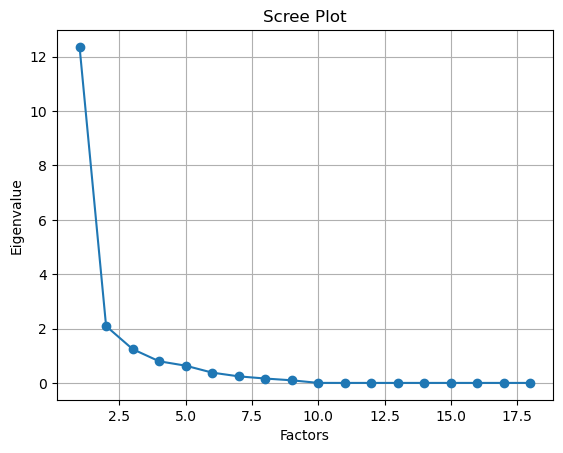

In [37]:
# Scree plot
plt.plot(range(1, n_factors+1), ev, marker = 'o')
plt.xlabel('Factors')
plt.ylabel('Eigenvalue')
plt.title('Scree Plot')
plt.grid()
plt.show()

In [38]:
if n_factors_kg == len(ev[ev > 1]):
    print("The number of eigenvalues greater than 1 in the scree plot matches the number of factors to be retained according to the Kaiser-Guttman rule.")
    print("The number of factors to retain:", n_factors_kg)

The number of eigenvalues greater than 1 in the scree plot matches the number of factors to be retained according to the Kaiser-Guttman rule.
The number of factors to retain: 3


Obtaining factor loadings using oblique rotations promax and oblimin

Factor loadings: 

[[-0.6277832   0.45721121  0.23811843]
 [-0.06438124  0.71231049  0.0160479 ]
 [ 0.82482807  0.31679858 -0.16018092]
 [-0.01176424 -0.4131094   0.37320969]
 [-0.39245438 -0.60569868 -0.10078175]
 [-0.08919619 -0.0587051  -0.44921993]
 [-0.86769263 -0.07591401  0.30507391]
 [-1.0011701  -0.04100483  0.07458446]
 [ 0.98876249  0.02119433  0.08295104]
 [ 0.97589437 -0.01345215  0.12607198]
 [ 0.9719657  -0.00307138  0.14437446]
 [ 0.97279145 -0.00911913  0.14036101]
 [ 0.99341317 -0.00294235  0.0499851 ]
 [ 0.99015817  0.00318073  0.07121992]
 [ 0.98193777 -0.01591546  0.10326663]
 [ 0.97880038 -0.00701683  0.12095634]
 [ 0.97891512 -0.0119197   0.11849902]
 [-0.70985783  0.57301914  0.11350588]]


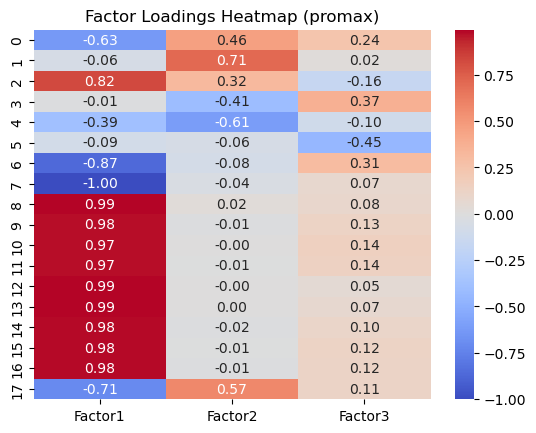

Communalities: 
 [0.65985422 0.51178872 0.80636061 0.31008325 0.53104829 0.2132008
 0.85172354 1.00958581 0.98498134 0.96844493 0.96557073 0.96610758
 0.98937689 0.9854956  0.97511908 0.97272985 0.9724589  0.84513265]

Variance explained:
 (array([12.16871434,  1.69474764,  0.65560081]), array([0.67603969, 0.09415265, 0.03642227]), array([0.67603969, 0.77019233, 0.8066146 ]))


In [ ]:
# Using promax rotation to get loadings
fa = FactorAnalyzer(n_factors_kg, rotation = 'promax')
fa.fit(corr)
loadings = fa.loadings_
print("Factor loadings: \n")
print(loadings)

loadings_df = pd.DataFrame(loadings, columns=['Factor1', 'Factor2', 'Factor3'])
sns.heatmap(loadings_df, cmap='coolwarm', annot=True, fmt=".2f")
plt.title(f'Factor Loadings Heatmap ({fa.rotation})')
plt.show()

communalities = fa.get_communalities()
print('Communalities: \n', communalities)
var_exp = fa.get_factor_variance()
print("\nVariance explained:\n", var_exp)

Factor loadings: 

[[-4.36997878e-01  5.36850454e-01  2.04821596e-01]
 [ 8.26192867e-03  7.05710618e-01 -1.18957784e-01]
 [ 7.36341079e-01  2.36739839e-01 -2.93455280e-01]
 [ 1.55134048e-01 -3.02803184e-01  4.65761097e-01]
 [-4.85663076e-01 -6.07511301e-01  4.76823428e-02]
 [-3.34574392e-01 -1.77258334e-01 -4.42543980e-01]
 [-6.78315178e-01  4.08521355e-02  3.98146766e-01]
 [-9.28967182e-01  1.69343406e-02  1.65307696e-01]
 [ 1.00065457e+00  7.19174087e-03  1.37977779e-03]
 [ 1.00860909e+00 -1.45326219e-02  5.35378371e-02]
 [ 1.01563643e+00  8.06230035e-04  7.06001596e-02]
 [ 1.01373442e+00 -6.25672858e-03  6.76060697e-02]
 [ 9.85186221e-01 -2.56842866e-02 -2.80833436e-02]
 [ 9.94083931e-01 -1.37455866e-02 -7.22342735e-03]
 [ 1.00186714e+00 -2.34123260e-02  3.01180595e-02]
 [ 1.00919743e+00 -9.72455558e-03  4.67799927e-02]
 [ 1.00755194e+00 -1.52121596e-02  4.52151841e-02]
 [-5.73679420e-01  6.19400434e-01  6.06003091e-02]]


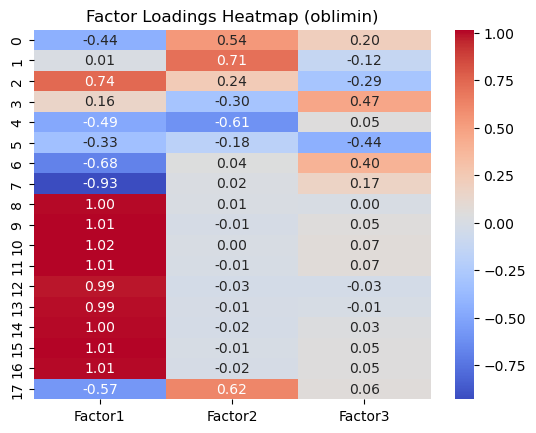

Communalities: 
 [0.52112744 0.51224669 0.68435994 0.33268974 0.60721221 0.33920571
 0.62030123 0.89059343 1.00136319 1.02036979 1.03650239 1.0322672
 0.97204025 0.98844398 1.00519299 1.02076238 1.01743673 0.71643737]

Variance explained:
 (array([11.83125795,  1.72209992,  0.7651948 ]), array([0.65729211, 0.09567222, 0.04251082]), array([0.65729211, 0.75296433, 0.79547515]))


In [ ]:
# Using oblimin rotation to get loadings
fa = FactorAnalyzer(n_factors_kg, rotation = 'oblimin')
fa.fit(corr)
loadings = fa.loadings_
print("Factor loadings: \n")
print(loadings)

loadings_df = pd.DataFrame(loadings, columns=['Factor1', 'Factor2', 'Factor3'])
sns.heatmap(loadings_df, cmap='coolwarm', annot=True, fmt=".2f")
plt.title(f'Factor Loadings Heatmap ({fa.rotation})')
plt.show()

communalities = fa.get_communalities()
print('Communalities: \n', communalities)
var_exp = fa.get_factor_variance()
print("\nVariance explained:\n", var_exp)

Obtaining the factor loadings using varimax rotation (orthogonal)

In [39]:
# Using varimax rotation to get loadings
fa = FactorAnalyzer(n_factors_kg, rotation = 'varimax')
fa.fit(corr)

FactorAnalyzer(rotation='varimax', rotation_kwargs={})

In [40]:
# Get the factor loadings
loadings = fa.loadings_
print("Factor loadings: \n")
print(loadings)

Factor loadings: 

[[-0.6395593   0.47932823  0.17974745]
 [-0.09856987  0.71334582 -0.01768128]
 [ 0.80093278  0.28311315 -0.121882  ]
 [ 0.02243328 -0.41839051  0.38938735]
 [-0.36533132 -0.58557196 -0.09988036]
 [-0.10276491 -0.04669747 -0.45194507]
 [-0.85011065 -0.04344629  0.25393626]
 [-0.99348929  0.00130449  0.01387351]
 [ 0.98794967 -0.02334148  0.1435813 ]
 [ 0.97842362 -0.05812466  0.18730893]
 [ 0.97467741 -0.04792071  0.20491823]
 [ 0.97564842 -0.0539203   0.20121183]
 [ 0.99254576 -0.04704287  0.11193965]
 [ 0.98978938 -0.04116933  0.13269831]
 [ 0.98372225 -0.06043934  0.16500212]
 [ 0.98081501 -0.05173796  0.18211027]
 [ 0.98107873 -0.05659185  0.17986666]
 [-0.73171738  0.60068677  0.04529939]]


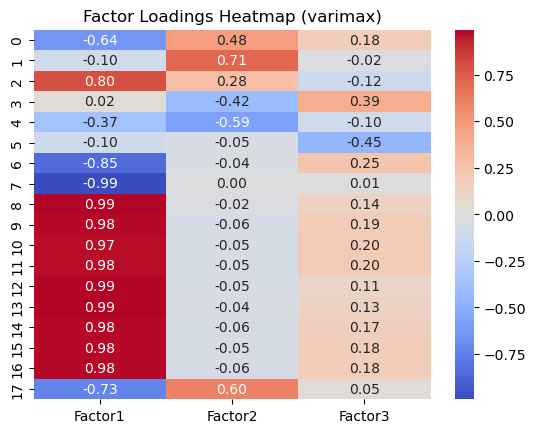

In [41]:
# Create a dataframe from the factor loadings
loadings_df = pd.DataFrame(loadings, columns=['Factor1', 'Factor2', 'Factor3'])

# Plot the heatmap
sns.heatmap(loadings_df, cmap='coolwarm', annot=True, fmt=".2f")
plt.title(f'Factor Loadings Heatmap ({fa.rotation})')
plt.show()

Values closer to -1 or 1 in the factor loadings signifies a higher association between the observed variable and the corresponding factor. While a value close to 0 shows that the factor has a weal influence over the variable.

In [42]:
# Extract the communalities
communalities = fa.get_communalities()
print('Communalities: \n', communalities)

Communalities: 
 [0.6711008  0.51889091 0.7365016  0.32717638 0.48633759 0.21699563
 0.78905933 0.98721514 0.99720497 0.9957759  0.99428393 0.99528344
 0.9998906  0.99898677 0.99858809 0.99783904 0.99807012 0.89828696]


The communalities represent the proportion of variance of each observed variable that can be explained by the factors.

In [43]:
# Get the variance explained by each factor
var_exp = fa.get_factor_variance()
print("\nVariance explained:\n", var_exp)


Variance explained:
 (array([12.14219208,  1.72417795,  0.74111716]), array([0.67456623, 0.09578766, 0.04117318]), array([0.67456623, 0.77035389, 0.81152707]))


The variance explained gives an idea of how much of the total variance in the original data can be explained by the factors extracted through factor analysis.

### Choosing the factors based on factor loadings using varimax

Taking factors from qol based on the indices in fact_1, fact_2, fact_3. Here, the factors are still unscaled since it is taken from qol

In [44]:
var = x_norm.columns.tolist()

fact_1 = [0, 2, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17]
fact_2 = [1, 3, 4]
fact_3 = [5]

# Selecting columns from qol (unscaled) based on the indices in fact_1, 2, 3
factor1_df = qol[[var[j] for j in fact_1]]
factor2_df = qol[[var[j] for j in fact_2]]
factor3_df = qol[[var[j] for j in fact_3]]

print("Factor 1 dataframe:")
print(factor1_df.head())

print("\nFactor 2 dataframe:")
print(factor2_df.head())

print("\nFactor 3 dataframe:")
print(factor3_df.head())

Factor 1 dataframe:
   2022 Population  Unemployment  Cost of Living  2022 Median Income    1p0c  \
0           6605.0        0.0321        75531.37            78038.78  0.5154   
1            576.0        0.0181        63913.28            67513.81  0.5447   
2            693.0        0.0354        64361.02            55946.62  0.6729   
3           1081.0        0.0719        87709.32            85446.30  0.5091   
4           2788.0        0.0419        59389.29            52946.23  0.6361   

     1p1c    1p2c    1p3c    1p4c    2p0c    2p1c    2p2c    2p3c    2p4c  
0  0.7445  0.9151  1.1116  1.1990  0.6797  0.9007  1.0557  1.2382  1.3187  
1  0.7372  0.8694  1.0546  1.1195  0.7203  0.9073  1.0421  1.2005  1.2711  
2  0.9058  1.0609  1.2710  1.3584  0.8796  1.1073  1.2511  1.4591  1.5379  
3  0.7900  0.9919  1.2139  1.2832  0.6918  0.9401  1.1302  1.3218  1.3930  
4  0.8592  1.0334  1.2257  1.3191  0.8554  1.0873  1.2445  1.4199  1.5363  

Factor 2 dataframe:
   2016 Crime Rate  20

Scale the factors and fit it into the DataFrame

In [45]:
factor1_scaled = scaler.fit_transform(factor1_df)
factor2_scaled = scaler.fit_transform(factor2_df)
factor3_scaled = scaler.fit_transform(factor3_df)

factor1_scaled_df = pd.DataFrame(factor1_scaled, columns=factor1_df.columns)
factor2_scaled_df = pd.DataFrame(factor2_scaled, columns=factor2_df.columns)
factor3_scaled_df = pd.DataFrame(factor3_scaled, columns=factor3_df.columns)

### Linear regression
Multiple linear regression is used since we have single dependent variable (y) and multiple independent variables (x)

Create scatter plot for each column in factor1_scaled_df DataFrame

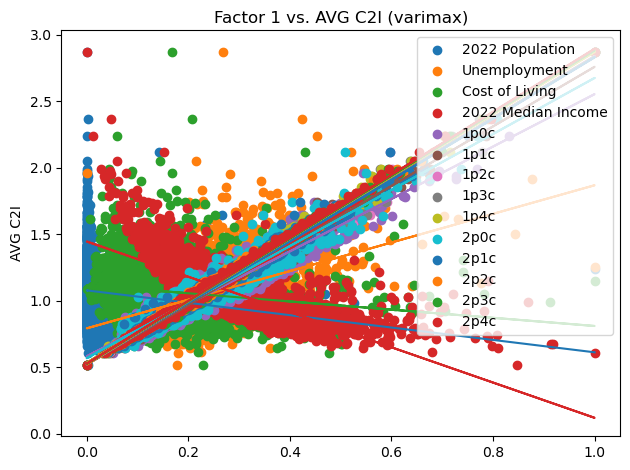

In [46]:
factor = factor1_scaled_df
facname = "Factor 1"  # Putting factor 1 as the independent variables

for i, col in enumerate(factor.columns):
    plt.scatter(factor[col], y, label=col)
    
    # Fitting linear regression line to the scatter plot
    m, b = np.polyfit(factor[col], y, 1)
    plt.plot(factor[col], m*factor[col] + b)
    plt.ylabel('AVG C2I')
    plt.title(f"{facname} vs. AVG C2I ({fa.rotation})")

plt.legend()
plt.tight_layout()
plt.show()

Training and evaluating linear regression model on the data

In [47]:
# Split the data into training and testing sets
X = factor1_scaled_df
X_train, X_test, y_train, y_test = train_test_split(X, y_norm, test_size=0.2, random_state=42)

# Linear regression model
model = LinearRegression()

# Fit the model to data
model.fit(X_train, y_train)

# Predict the target variable
y_pred = model.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
accuracy = model.score(X_test, y_test) * 100

print("Mean Squared Error:", mse)
print("R-squared:", r2)
print("Mean Absolute Error:", mae)
print(f"Regression Accuracy: {accuracy:.2f}%")

Mean Squared Error: 1.6087050102567634e-10
R-squared: 0.9999999757826991
Mean Absolute Error: 1.0824300186423941e-05
Regression Accuracy: 100.00%


Scatter plot to visualize the performance of the linear regression model

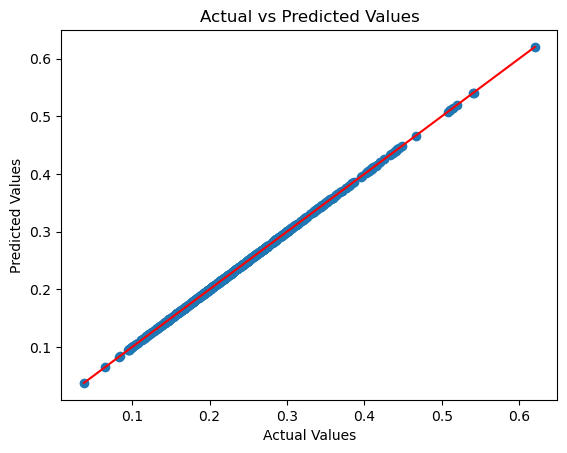

In [48]:
# Scatter plot of actual vs predicted values
plt.scatter(y_test, y_pred)
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title('Actual vs Predicted Values')

# Plotting the identity line
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], color='red')

plt.show()

Linear Regression for Factor 2

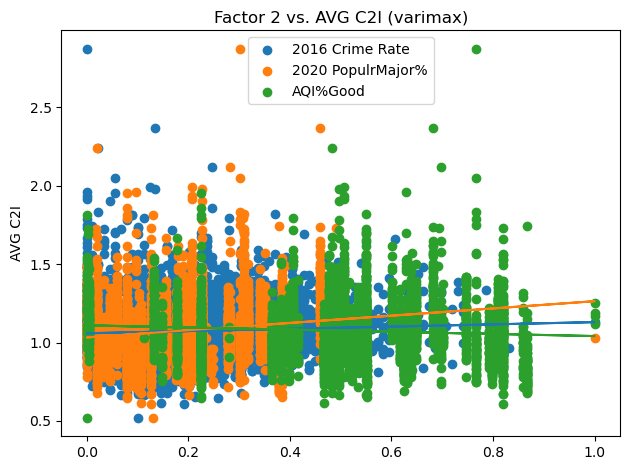

Mean Squared Error: 0.006518361046424277
R-squared: 0.018731772948691883
Mean Absolute Error: 0.06096707212439282
Regression Accuracy: 1.87%


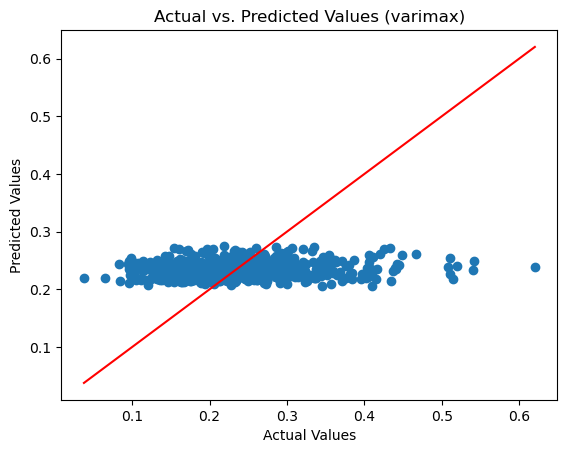

In [49]:
factor = factor2_scaled_df
facname = "Factor 2"

for i, col in enumerate(factor.columns):
    plt.scatter(factor[col], y, label=col)
    m, b = np.polyfit(factor[col], y, 1)
    plt.plot(factor[col], m*factor[col] + b)
    plt.ylabel('AVG C2I')
    plt.title(f"{facname} vs. AVG C2I ({fa.rotation})")

plt.legend()
plt.tight_layout()
plt.show()

X = factor2_scaled_df
X_train, X_test, y_train, y_test = train_test_split(X, y_norm, test_size = 0.2, random_state = 42)

model = LinearRegression()
model.fit(X_train, y_train)
y_pred = model.predict(X_test)

mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
accuracy = model.score(X_test, y_test) * 100

print("Mean Squared Error:", mse)
print("R-squared:", r2)
print("Mean Absolute Error:", mae)
print(f"Regression Accuracy: {accuracy:.2f}%")

plt.scatter(y_test, y_pred)
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title(f'Actual vs. Predicted Values ({fa.rotation})')

plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], color='red')
plt.show()

 Linear regression for factor 3

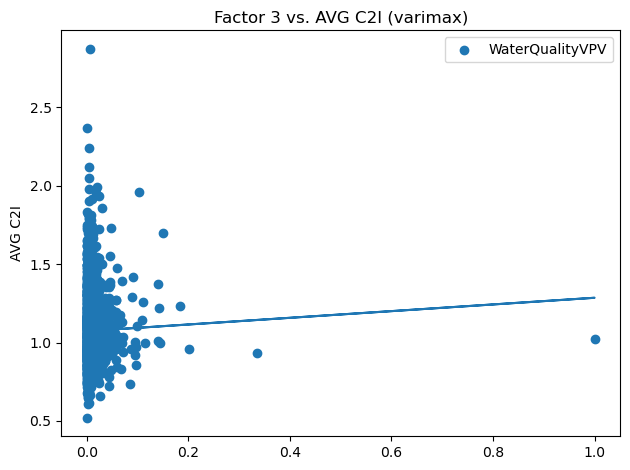

Mean Squared Error: 0.006650881548904457
R-squared: -0.001217744666323961
Mean Absolute Error: 0.062090070412355376
Regression Accuracy: -0.12%


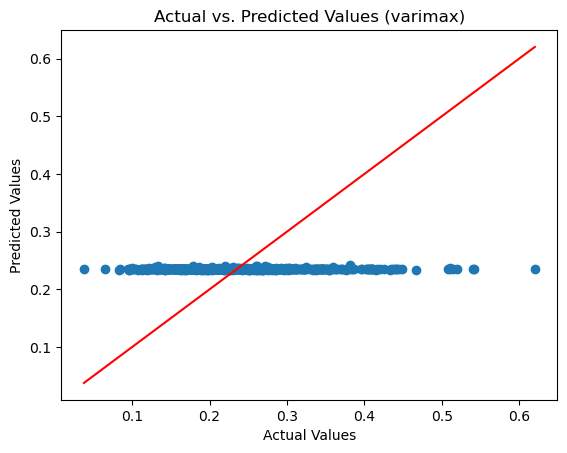

In [50]:
factor = factor3_scaled_df
facname = "Factor 3"

for i, col in enumerate(factor.columns):
    plt.scatter(factor[col], y, label=col)
    m, b = np.polyfit(factor[col], y, 1)
    plt.plot(factor[col], m*factor[col] + b)
    plt.ylabel('AVG C2I')
    plt.title(f"{facname} vs. AVG C2I ({fa.rotation})")

plt.legend()
plt.tight_layout()
plt.show()

X = factor3_scaled_df
X_train, X_test, y_train, y_test = train_test_split(X, y_norm, test_size = 0.2, random_state = 42)

model = LinearRegression()
model.fit(X_train, y_train)
y_pred = model.predict(X_test)

mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
accuracy = model.score(X_test, y_test) * 100

print("Mean Squared Error:", mse)
print("R-squared:", r2)
print("Mean Absolute Error:", mae)
print(f"Regression Accuracy: {accuracy:.2f}%")

plt.scatter(y_test, y_pred)
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title(f'Actual vs. Predicted Values ({fa.rotation})')

plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], color='red')
plt.show()

## Prediction from Factor 1

Define X and y variables

In [51]:
avgc2i_df = qol[['AVG C2I']]

# Leave the target variable unscaled
X = factor1_scaled_df
y = avgc2i_df['AVG C2I']

Splitting data into training and testing sets

In [52]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state=42)

Perform hyperparameter tuning for SVR model using randomized search and cross-validation

In [53]:
param_dist = {'C': np.logspace(-3, 3, 1000), 'epsilon': np.logspace(-3, 0, 1000), 'gamma': ['scale', 'auto']}
random_search = RandomizedSearchCV(SVR(kernel='linear'), param_distributions=param_dist, n_iter=100, cv=5, random_state=42)
random_search.fit(X_train, y_train)

print("Best parameters: ", random_search.best_params_)
print("Best cross-validation score: ", random_search.best_score_)

Best parameters:  {'gamma': 'scale', 'epsilon': 0.0010209606623060466, 'C': 51.84593543892913}
Best cross-validation score:  0.9999959544969925


Create SVR model with best hyperparameters, then train

In [54]:
model = SVR(kernel='linear', C=random_search.best_params_['C'], epsilon=random_search.best_params_['epsilon'], gamma=random_search.best_params_['gamma'])  # or 'rbf' or 'poly'
model.fit(X_train, y_train)

predictions = model.predict(X_test)


mse = mean_squared_error(y_test, predictions)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test, predictions)
r2 = r2_score(y_test, predictions)

print(f"Mean Squared Error: {mse}")
print(f"Root Mean Squared Error: {rmse}")
print(f"Mean Absolute Error: {mae}")
print(f"R-squared: {r2}")

Mean Squared Error: 1.5524621471962947e-07
Root Mean Squared Error: 0.00039401296262893366
Mean Absolute Error: 0.00032590647021568843
R-squared: 0.9999957788917444


Use residual to assess the model fit. Good model should have residuals randomly scattered around y = 0

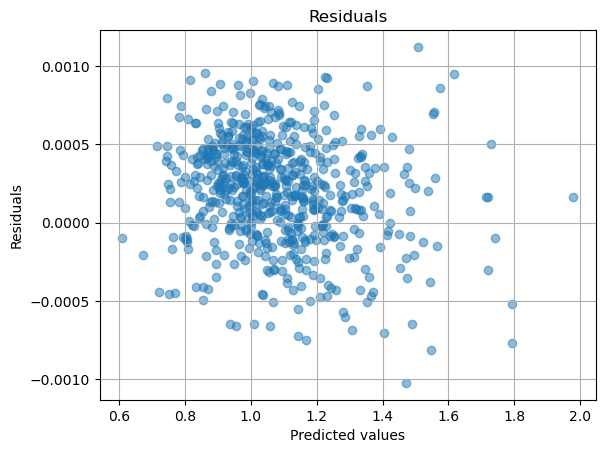

In [55]:
residuals = y_test - predictions

plt.scatter(predictions, residuals, alpha=0.5)
plt.title('Residuals')
plt.xlabel('Predicted values')
plt.ylabel('Residuals')
plt.grid(True)
plt.show()

Comparison between predicted values and actual values in scatter plot

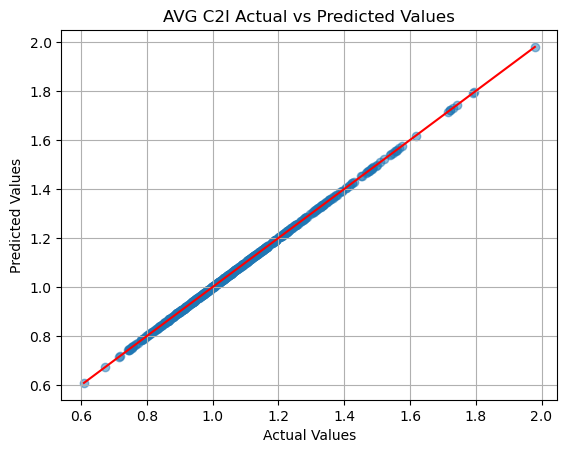

In [56]:
plt.scatter(y_test, predictions, alpha=0.5)
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red')  # This is the y=x line
plt.title('AVG C2I Actual vs Predicted Values')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.grid(True)
plt.show()